# DATA3402 Python2: Lab 5

You are tasked with evaluating card counting strategies for black jack. In order to do so, you will use object oriented programming to create a playable casino style black jack game where a computer dealer plays against $n$ computer players and possibily one human player. If you don't know the rules of blackjack or card counting, please google it. 

A few requirements:
* The game should utilize multiple 52-card decks. Typically the game is played with 6 decks.
* Players should have chips.
* Dealer's actions are predefined by rules of the game (typically hit on 16). 
* The players should be aware of all shown cards so that they can count cards.
* Each player could have a different strategy.
* The system should allow you to play large numbers of games, study the outcomes, and compare average winnings per hand rate for different strategies.

1. Begin by creating a classes to represent cards and decks. The deck should support more than one 52-card set. The deck should allow you to shuffle and draw cards. Include a "plastic" card, placed randomly in the deck. Later, when the plastic card is dealt, shuffle the cards before the next deal.

In [1]:
import random

class Card:
    suits = ['Clubs', 'Spades', 'Diamonds', 'Hearts']
    values = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'Jack', 'Queen', 'King', 'Ace']
    
    def __init__(self, card_value, card_suit):
        self.card_value = card_value
        self.card_suit = card_suit
        
    def __str__(self):
        return f"{self.card_value}, {self.card_suit}"

class Deck:
    def __init__(self, num):
        self.num = num
        self.cards = []
        
        for i in range(num):
            for suit in Card.suits:
                for value in Card.values:
                    face = Card(value, suit)
                    self.cards.append(face)

        self.shuffle()

    def shuffle(self):
        random.shuffle(self.cards)
        self.plastic_position = random.randint(0, len(self.cards))

    def draw(self):
        if len(self.cards) == 0:
            return None

        if len(self.cards) == self.plastic_position + 1:
            self.shuffle()
            return self.draw()  

        return self.cards.pop()

In [2]:
if __name__ == "__main__":
    num = 2  
    deck = Deck(num)
    
    for i in range(10):  
        card = deck.draw()
        print(card)

2, Hearts
6, Spades
5, Clubs
Queen, Diamonds
King, Clubs
10, Clubs
4, Spades
9, Diamonds
3, Hearts
2, Diamonds


2. Now design your game on a UML diagram. You may want to create classes to represent, players, a hand, and/or the game. As you work through the lab, update your UML diagram. At the end of the lab, submit your diagram (as pdf file) along with your notebook. 

3. Begin with implementing the skeleton (ie define data members and methods/functions, but do not code the logic) of the classes in your UML diagram.

In [6]:
#data member class player 
#class player:
    #def drawcards to make a hand:
        
    #def calculate to count up the value of the cards in hand:

#class dealer:
    #def reveal the dealers top card

#class gameplay
    #def hit startegy and switching players for game
    #def basic winning rules:
        # if 21 winner, if over 21 loser, if under 21 but higher than dealer winner, 
        #if under 21 but lower than dealer loser, if same as dealer tie
    

4. Complete the implementation by coding the logic of all functions. For now, just implement the dealer player and human player.

In [51]:
class Player:
    def __init__(self, name):
        self.name=name
        self.hand=[]
        self.chips=100

    def draw_card(self, card):
        self.hand.append(card)

    def calc_cards(self):
        score=0
        num_aces=0
        valid_num=['2','3','4','5','6','7','8','9','10']
        face_cards=['King','Queen','Jack']
  
        for card in self.hand:
            if card.card_value in valid_num:
                score += int(card.card_value)

            elif card.card_value in face_cards:
                score += 10

            elif card.card_value=='Ace':
                num_aces += 1
                score +=11

        while num_aces>0 and score>21:
            score -= 10
            num_aces -= 1

        return score

class Dealer(Player):
    def __init__(self):
        super().__init__('Dealer')

    def reveal_card_1(self):
        return self.hand[0]

deck = Deck(num=1)
player = Player("Player 1")
dealer = Dealer()

In [52]:
deck = Deck(num)
player = Player("Player 1")
dealer = Dealer()

player.draw_card(deck.draw())
dealer.draw_card(deck.draw())
player.draw_card(deck.draw())
dealer.draw_card(deck.draw())

print(f"Player's hand: {[str(card) for card in player.hand]}")
print(f"Player's score: {player.calc_cards()}")

print(f"Dealer's face-up card: {str(dealer.reveal_card_1())}")

Player's hand: ['8, Spades', '6, Hearts']
Player's score: 14
Dealer's face-up card: 7, Clubs


5.  Test. Demonstrate game play. For example, create a game of several dealer players and show that the game is functional through several rounds.

In [145]:
class Gameplay(Player):
    def __init__(self, num_decks=1):
        self.deck=Deck(num_decks)
        self.player=Player("Player 1")
        self.dealer=Dealer()
        self.player_turn=True

    def starting_hand(self):
        self.player.draw_card(self.deck.draw())
        self.dealer.draw_card(self.deck.draw())
        self.player.draw_card(self.deck.draw())
        self.dealer.draw_card(self.deck.draw())

        dealer_reveal=self.dealer.reveal_card_1()
        print(f"dealer's face up card: {dealer_reveal}")
        
        player_score=self.player.calc_cards()
        print(f"Player's hand: {[str(card) for card in self.player.hand]}")
        print(f"Player's score: {player_score}")
        

    
    def hit(self):
        card= self.deck.draw()
        if card:
            self.player.draw_card(card)
            print(f"{self.player.name} drew {card}")
        else:
            print("No cards")

    def switch_player(self):
        self.player_turn= not self.player_turn

    def play(self):
        self.starting_hand()
        while True:
            if self.player_turn:
                move=input("Y to hit or N to stand:")
                if move=="Y":
                    self.hit()
                    player_score=self.player.calc_cards()
                    print(f"Player's hand: {[str(card) for card in self.player.hand]}")
                    print(f"Player's score: {player_score}")
                    if player_score> 21:
                        print("player busts! dealers wins!")
                        break
                elif move=='N':
                    self.switch_player()
                elif move!='Y' or 'N':
                    break
            else:
                dealer_score=self.dealer.calc_cards()
                print(f"Dealer's hand: {[str(card) for card in self.dealer.hand]}")
                print(f"Dealer's score: {dealer_score}")
                if dealer_score >= 17:
                    break
                else:
                    card= self.deck.draw()
                    if card:
                        self.dealer.draw_card(card)
                        print(f"dealer drew {card}")
                    else:
                        print("no more cards")

        player_score=self.player.calc_cards()
        dealer_score=self.dealer.calc_cards()
        print("----------------\n final score")
        print(f"player's score: {player_score}")
        print(f"dealer's score: {dealer_score}")

        if player_score > 21:
            print("player busts! dealer wins!")
        elif dealer_score > 21:
            print("dealer busts! player wins!")
        elif player_score>dealer_score:
            print("player wins!")
        elif dealer_score>player_score:
            print("dealer wins!")
        elif player_score==dealer_score:
            print("its a tie!")


In [147]:
game=Gameplay(num_decks=num)
game.play()

dealer's face up card: 6, Clubs
Player's hand: ['7, Diamonds', '2, Diamonds']
Player's score: 9


Y to hit or N to stand: Y


Player 1 drew 2, Clubs
Player's hand: ['7, Diamonds', '2, Diamonds', '2, Clubs']
Player's score: 11


Y to hit or N to stand: Y


Player 1 drew 9, Spades
Player's hand: ['7, Diamonds', '2, Diamonds', '2, Clubs', '9, Spades']
Player's score: 20


Y to hit or N to stand: N


Dealer's hand: ['6, Clubs', '9, Diamonds']
Dealer's score: 15
dealer drew King, Diamonds
Dealer's hand: ['6, Clubs', '9, Diamonds', 'King, Diamonds']
Dealer's score: 25
----------------
 final score
player's score: 20
dealer's score: 25
dealer busts! player wins!


6. Implement a new player with the following strategy:

    * Assign each card a value: 
        * Cards 2 to 6 are +1 
        * Cards 7 to 9 are 0 
        * Cards 10 through Ace are -1
    * Compute the sum of the values for all cards seen so far.
    * Hit if sum is very negative, stay if sum is very positive. Select a threshold for hit/stay, e.g. 0 or -2.  

In [55]:
class Newplayer(Player):
    def __init__(self,name,min_threshold=-2, max_threshold=2):
        super().__init__(name)
        self.min_threshold=min_threshold
        self.max_threshold=max_threshold
        self.new_values={'2':1,'3':1,'4':1,'5':1,'6':1,
                         '7':0,'8':0,'9':0,
                         '10':-1,'Jack':-1,'Queen':-1,'King':-1,'Ace':-1}
    def decide(self):
        total=sum(self.new_values.get(card.card_value, 0) for card in self.hand)
        if total >=self.min_threshold:
            decision="hit"
        elif total <= self.max_threshold:
            decision="stand"
        else:
            decision="think"
        return decision
        self.hand=[]

player_2=Newplayer("player 2")

In [56]:
player_2.draw_card(deck.draw())
player_2.draw_card(deck.draw())

player_2_score=player_2.calc_cards()
choice=player_2.decide()

print(f"player 2's hand: {[str(card) for card in player_2.hand]}")
print(f"player 2's score: {player_2_score}")
print(f"player 2 decides to {choice}")

player 2's hand: ['7, Clubs', '5, Spades']
player 2's score: 12
player 2 decides to hit


7. Create a test scenario where one player, using the above strategy, is playing with a dealer and 3 other players that follow the dealer's strategy. Each player starts with same number of chips. Play 50 rounds (or until the strategy player is out of money). Compute the strategy player's winnings. You may remove unnecessary printouts from your code (perhaps implement a verbose/quiet mode) to reduce the output.

In [57]:
class Scenario:
    def __init__(self, num_decks=1, num_players=4, rounds=50, starting_chips=100):
        self.num_decks=num_decks
        self.num_players=num_players
        self.rounds=rounds
        self.starting_chips=starting_chips
        self.player_2=Newplayer("player 2", -2,2)

    def test_round(self):
        dealer=Dealer()
        players=[Player(f"player {i+1}") for i in range(self.num_players-1)]
        players.append(self.player_2)

        for player in players:
            player.chips=self.starting_chips

        for i in range(self.rounds):
            for player in players:
                player.hand=[]

            game= Gameplay(self.num_decks)
            game.starting_hand()

            for player in players:
                while game.player_turn:
                    if player==self.player_2:
                        decision=self.player_2.decide()
                        if decision=="hit":
                            game.hit()
                        else:
                            game.switch_player()

                    else:
                        move="Y" if random.random() <0.5 else "N"
                        if move=='Y':
                            game.hit()
                        else:
                            game.switch_player()

                while not game.player_turn:
                    dealer_score=dealer.calc_cards()
                    if dealer_score >=17:
                        break
                    else:
                        card=game.deck.draw()
                        if card:
                            dealer.draw_card(card)

                player_score=player.calc_cards()
                dealer_score= dealer.calc_cards()

                if player_score>21:
                    player.chips-=1
                elif dealer_score >21:
                    player.chips+=1
                elif 21>player_score>dealer_score:
                    player.chips+=1
                elif player_score==dealer_score:
                    player.chips-=1
                else:
                    player.chips-=1
                    
            return self.player_2.chips

In [58]:
test=Scenario(1,4,50,100)
total_wins=test.test_round()
print(f"player 2's total winnings after 50 rounds is: {total_wins}")

Player's hand: ['10, Spades', '5, Diamonds']
Player's score: 15
player 2's total winnings after 50 rounds is: 99


8. Create a loop that runs 100 games of 50 rounds, as setup in previous question, and store the strategy player's chips at the end of the game (aka "winnings") in a list. Histogram the winnings. What is the average winnings per round? What is the standard deviation. What is the probabilty of net winning or lossing after 50 rounds?


In [41]:
import numpy as np
import matplotlib.pyplot as plt

num_games=100
winnings=[]

for i in range(num_games):
    test=Scenario(1,4,50,100)
    total_wins=test.test_round()
    winnings.append(total_wins)

Player's hand: ['King, Hearts', '5, Hearts']
Player's score: 15
Player's hand: ['7, Clubs', '10, Diamonds']
Player's score: 17
Player 1 drew 6, Spades
Player 1 drew 9, Clubs
Player 1 drew Jack, Clubs
Player 1 drew 6, Clubs
Player 1 drew 7, Spades
Player 1 drew 8, Diamonds
Player 1 drew 5, Diamonds
Player's hand: ['9, Diamonds', '6, Clubs']
Player's score: 15
Player 1 drew Ace, Clubs
Player's hand: ['Jack, Clubs', '6, Diamonds']
Player's score: 16
Player's hand: ['5, Clubs', 'King, Diamonds']
Player's score: 15
Player's hand: ['7, Clubs', 'Queen, Clubs']
Player's score: 17
Player 1 drew 3, Hearts
Player's hand: ['7, Clubs', '5, Hearts']
Player's score: 12
Player 1 drew Queen, Diamonds
Player's hand: ['7, Spades', '4, Spades']
Player's score: 11
Player 1 drew 9, Hearts
Player 1 drew King, Hearts
Player 1 drew King, Spades
Player's hand: ['3, Diamonds', '3, Hearts']
Player's score: 6
Player's hand: ['7, Hearts', '5, Clubs']
Player's score: 12
Player 1 drew 4, Diamonds
Player 1 drew 6, Spa

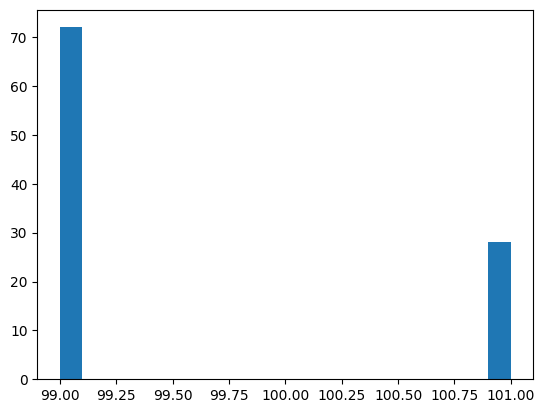

average winings per round: 0.019912
standard deviation: 0.8979977728257462
probability of winning after 50 rounds: 0.02
probability of losing after 50 rounds: 0.0


In [50]:
plt.hist(winnings, bins=20)
plt.show()

wins_per_round=np.mean(winnings)/(num_games*test.rounds)
print("average winings per round:", wins_per_round)

game_std=np.std(winnings)
print("standard deviation:", game_std)

win_prob=np.sum(np.array(winnings)>0)/(num_games*test.rounds)
print("probability of winning after 50 rounds:", win_prob)

lose_prob=np.sum(np.array(winnings)<0)/(num_games*test.rounds)
print("probability of losing after 50 rounds:", lose_prob)

9. Repeat previous questions scanning the value of the threshold. Try at least 5 different threshold values. Can you find an optimal value?

In [114]:
num_games=100
threshold_num=[1,2,3,4,5]
results={}

for threshold in threshold_num:
    winnings=[]
    
    for j in range(num_games):
        test=Scenario(1,4,50,100)
        test.player_2.min_threshold=threshold
        total_wins=test.test_round()
        winnings.append(total_wins)
        
        wins_per_round=np.mean(winnings)/(num_games*test.rounds)
        
        game_std=np.std(winnings)
        
        win_prob=np.sum(np.array(winnings)>0)/(num_games*test.rounds)
        
        lose_prob=np.sum(np.array(winnings)<0)/(num_games*test.rounds)

        results[threshold]={
            "average winings per round:": wins_per_round,
            "standard deviation:": game_std,
            "probability of winning after 50 rounds:": win_prob,
            "probability of losing after 50 rounds:": lose_prob}

for threshold, info in results.items():
    print(f"threshold: {threshold}")
    print(f"average winnings per round: {info[wins_per_round]}")
    print(f"standard deviation: {info[game_std]}")
    print(f"probability of winning after 50 rounds: {info[win_prob]}")
    print(f"probability of losing after 50 rounds: {info[lose_prob]}")

Player's hand: ['8, Spades', '6, Hearts']
Player's score: 14
Player's hand: ['2, Spades', '9, Hearts']
Player's score: 11
Player 1 drew 8, Clubs
Player's hand: ['9, Diamonds', '9, Clubs']
Player's score: 18
Player 1 drew 7, Diamonds
Player 1 drew 3, Diamonds
Player's hand: ['5, Clubs', '3, Spades']
Player's score: 8
Player's hand: ['2, Diamonds', 'Jack, Clubs']
Player's score: 12
Player's hand: ['4, Hearts', '5, Spades']
Player's score: 9
Player 1 drew 7, Hearts
Player's hand: ['Jack, Diamonds', '6, Spades']
Player's score: 16
Player 1 drew King, Clubs
Player 1 drew Queen, Clubs
Player's hand: ['Queen, Spades', 'Ace, Diamonds']
Player's score: 21
Player 1 drew Ace, Clubs
Player's hand: ['8, Spades', '3, Clubs']
Player's score: 11
Player's hand: ['5, Diamonds', '3, Hearts']
Player's score: 8
Player 1 drew 7, Diamonds
Player's hand: ['Queen, Hearts', '9, Clubs']
Player's score: 19
Player's hand: ['5, Spades', 'Ace, Hearts']
Player's score: 16
Player's hand: ['King, Spades', '9, Hearts']


KeyError: 0.019908000000000002

10. Create a new strategy based on web searches or your own ideas. Demonstrate that the new strategy will result in increased or decreased winnings. 

In [148]:
#2-1 strategy where you bet 1 and after you win you bet 2 and then bet 1 again then 2 again

num_games = 100
bet_multiplier = 2

winnings = []

for i in range(num_games):
    test= Scenario(1,4,50,100)
    player_2 = Newplayer("Player 2", -2, 2)
    
    for i in range(test.rounds):
        bet = 2 * player_2.chips if player_2.chips > 0 else 0
        player_2.chips -= bet

        winnings = test_scenario.simulate_round()

        if winnings > 0:
            player_2.chips += bet
        elif winnings < 0:
            player_2.chips -= bet

    strategy_player_winnings.append(player_2.chips)


dealer's face up card: 3, Hearts
Player's hand: ['7, Hearts', 'Queen, Clubs']
Player's score: 17
Player 1 drew Ace, Clubs
Player 1 drew 4, Spades
dealer's face up card: 3, Diamonds
Player's hand: ['3, Spades', '7, Diamonds']
Player's score: 10
dealer's face up card: Ace, Clubs
Player's hand: ['10, Spades', '8, Diamonds']
Player's score: 18
dealer's face up card: 3, Spades
Player's hand: ['2, Diamonds', 'King, Clubs']
Player's score: 12
dealer's face up card: 9, Clubs
Player's hand: ['9, Hearts', 'Jack, Clubs']
Player's score: 19
dealer's face up card: 7, Clubs
Player's hand: ['6, Diamonds', 'King, Hearts']
Player's score: 16
dealer's face up card: 6, Spades
Player's hand: ['Ace, Hearts', 'Queen, Hearts']
Player's score: 21
dealer's face up card: 5, Spades
Player's hand: ['Jack, Diamonds', 'Queen, Hearts']
Player's score: 20
dealer's face up card: 8, Spades
Player's hand: ['3, Clubs', '2, Diamonds']
Player's score: 5
dealer's face up card: 8, Diamonds
Player's hand: ['6, Clubs', '10, Cl

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



dealer's face up card: 10, Clubs
Player's hand: ['5, Hearts', '4, Spades']
Player's score: 9
Player 1 drew 8, Diamonds
dealer's face up card: 6, Diamonds
Player's hand: ['2, Clubs', '8, Spades']
Player's score: 10
Player 1 drew 4, Diamonds
dealer's face up card: 2, Clubs
Player's hand: ['3, Spades', 'Ace, Clubs']
Player's score: 14
dealer's face up card: 2, Diamonds
Player's hand: ['10, Spades', 'King, Hearts']
Player's score: 20
Player 1 drew 10, Diamonds
Player 1 drew 6, Spades
dealer's face up card: 5, Hearts
Player's hand: ['Jack, Spades', '9, Diamonds']
Player's score: 19
Player 1 drew King, Spades
Player 1 drew 3, Clubs
dealer's face up card: Queen, Clubs
Player's hand: ['3, Diamonds', 'King, Hearts']
Player's score: 13
Player 1 drew 4, Hearts
Player 1 drew 9, Hearts
Player 1 drew 5, Diamonds
dealer's face up card: 10, Diamonds
Player's hand: ['8, Hearts', 'Queen, Diamonds']
Player's score: 18
Player 1 drew King, Diamonds
Player 1 drew King, Spades
dealer's face up card: 5, Spade

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



dealer's face up card: 3, Diamonds
Player's hand: ['7, Diamonds', '5, Hearts']
Player's score: 12
dealer's face up card: Jack, Spades
Player's hand: ['7, Spades', '10, Diamonds']
Player's score: 17
Player 1 drew 7, Hearts
dealer's face up card: King, Clubs
Player's hand: ['6, Hearts', '3, Spades']
Player's score: 9
dealer's face up card: King, Diamonds
Player's hand: ['Jack, Hearts', '3, Diamonds']
Player's score: 13
Player 1 drew 4, Hearts
dealer's face up card: 6, Clubs
Player's hand: ['9, Diamonds', 'Ace, Hearts']
Player's score: 20
Player 1 drew 2, Spades
dealer's face up card: 7, Clubs
Player's hand: ['10, Spades', 'Ace, Hearts']
Player's score: 21
Player 1 drew 8, Diamonds
dealer's face up card: 6, Hearts
Player's hand: ['9, Diamonds', 'Queen, Diamonds']
Player's score: 19
Player 1 drew 3, Hearts
Player 1 drew 3, Spades
dealer's face up card: 3, Clubs
Player's hand: ['2, Spades', '4, Spades']
Player's score: 6
Player 1 drew 5, Diamonds
Player 1 drew Jack, Diamonds
Player 1 drew 1

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



dealer's face up card: King, Diamonds
Player's hand: ['4, Hearts', 'Ace, Spades']
Player's score: 15
Player 1 drew 7, Hearts
Player 1 drew 7, Spades
Player 1 drew Ace, Hearts
dealer's face up card: 5, Hearts
Player's hand: ['10, Diamonds', 'Ace, Hearts']
Player's score: 21
Player 1 drew 4, Diamonds
Player 1 drew 3, Clubs
dealer's face up card: 4, Spades
Player's hand: ['6, Spades', '10, Hearts']
Player's score: 16
Player 1 drew Ace, Clubs
dealer's face up card: 2, Hearts
Player's hand: ['Jack, Clubs', '6, Spades']
Player's score: 16
Player 1 drew Ace, Hearts
Player 1 drew 3, Spades
dealer's face up card: 5, Spades
Player's hand: ['9, Clubs', '3, Clubs']
Player's score: 12
Player 1 drew Jack, Clubs
Player 1 drew 2, Spades
Player 1 drew 2, Clubs
dealer's face up card: 2, Clubs
Player's hand: ['Ace, Clubs', 'Queen, Diamonds']
Player's score: 21
dealer's face up card: King, Spades
Player's hand: ['2, Hearts', '2, Diamonds']
Player's score: 4
dealer's face up card: 7, Clubs
Player's hand: [

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



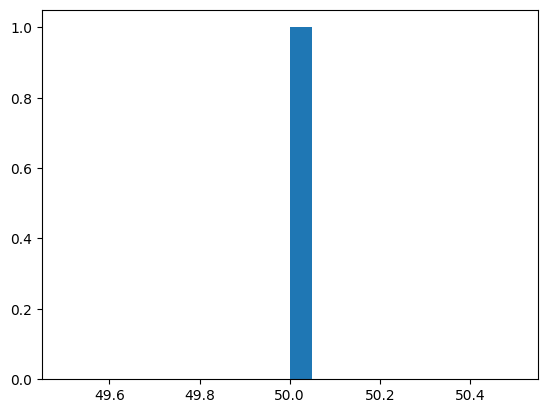

Average Winnings with 2-1 Betting: 96.83333333333333
Initial Total Chips: 1000000
Difference in Winnings: -999903.1666666666


In [149]:
plt.hist(winnings, bins=20)
plt.show()

average_winnings = np.mean(strategy_player_winnings)
initial_chips = num_games * test.rounds * bet_multiplier * test.starting_chips
winnings_diff = average_winnings - initial_chips

print(f"Average Winnings with 2-1 Betting: {average_winnings}")
print(f"Initial Total Chips: {initial_chips}")
print(f"Difference in Winnings: {winnings_diff}")